In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, roc_curve,log_loss, make_scorer,precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, classification_report,precision_recall_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')
from IPython.display import display
from imblearn.over_sampling import SMOTE

Using TensorFlow backend.


### Load Data

In [2]:
df = pd.read_csv("15min_dateset.csv")
df.drop('Unnamed: 0', inplace = True, axis = 1)
print(len(df['EXP'].unique()))
df.head(2)

32


,Date,Type,from,EXP,jul_date,hour_angle,max_wind_speed,avg_wind_speed,R1,R2,...,HYBL_one,HYBL_two,HYBL_three,HYBL_four,HYBL_five,diff_temp,geo_cbl,veg_sfc,best_4_layer,ws_700
0,2017-01-07 06:00:00,ANDE,MESONET,1/7/17,7,-1.570795,2.332608,1.295893,2.630564,2.322274,...,0.629230,0.903721,3.610055,5.011670,6.054984,0.739,-5000.0,40.293,23.757,16.787335
1,2017-01-07 06:15:00,ANDE,MESONET,1/7/17,7,-1.505345,1.555072,0.647947,2.055383,1.813005,...,0.748575,1.493288,3.643217,5.232982,6.394255,1.050,-5000.0,40.293,23.959,16.195689


### Wind greater than 30

In [3]:
df["max_th"] = np.where(df["max_wind_speed"] > 30, 1, 0 )
table = df["max_th"].value_counts()
total = table[1] + table[0]
df
print(table)
print('% greater than 30:', round(table[1]/total,6))
print('% less than 30:', round(table[0]/total,6))

0    69019
1     3630
Name: max_th, dtype: int64
% greater than 30: 0.049966
% less than 30: 0.950034


In [4]:
df3 = df[['EXP','R1', 'R2','Pressure_reduced_to_MSL_.Pa..0.MSL',
       'Derived_radar_reflectivity_.dB..1.HYBL',
       'u.component_of_wind_.m.s..85000.ISBL',
       'v.component_of_wind_.m.s..85000.ISBL', 'wind_speed_85000',
       'wind_shear_85000', 'Wind_speed_.gust._.m.s..0.SFC', 'HYBL_one',
       'HYBL_two', 'HYBL_three', 'HYBL_four', 'HYBL_five', 'diff_temp',
       'geo_cbl', 'veg_sfc', 'best_4_layer', 'ws_700', 'max_th']]

df3.groupby('max_th').agg(["mean", "std"])

R1                      R2               \
             mean          std       mean          std   
max_th                                                   
0       37.755478  2727.753951  52.429432  4426.994878   
1        0.515805     3.049755   0.268210    19.545732   

       Pressure_reduced_to_MSL_.Pa..0.MSL              \
                                     mean         std   
max_th                                                  
0                           101065.793411  989.561407   
1                           100458.189812  953.739812   

       Derived_radar_reflectivity_.dB..1.HYBL             \
                                         mean        std   
max_th                                                     
0                                    4.586647  13.473078   
1                                    6.334919  12.924945   

       u.component_of_wind_.m.s..85000.ISBL             ... diff_temp  \
                                       mean        std  ...      mean   
max_th                                                  ...             
0                                  4.580006  12.165544  ... -2.105725   
1                                  8.893676  18.755885  ... -4.352528   

                      geo_cbl                veg_sfc            best_4_layer  \
             std         mean         std       mean        std         mean   
max_th                                                                         
0       3.695331   324.482294  4415.75451  52.403075  23.318266     6.674381   
1       2.532385 -3068.652562  2994.97289  28.872450  19.591429    13.397909   

                     ws_700            
             std       mean       std  
max_th                                 
0       8.601083   8.578866  5.564750  
1       6.313587  11.029253  5.167943  

[2 rows x 38 columns]

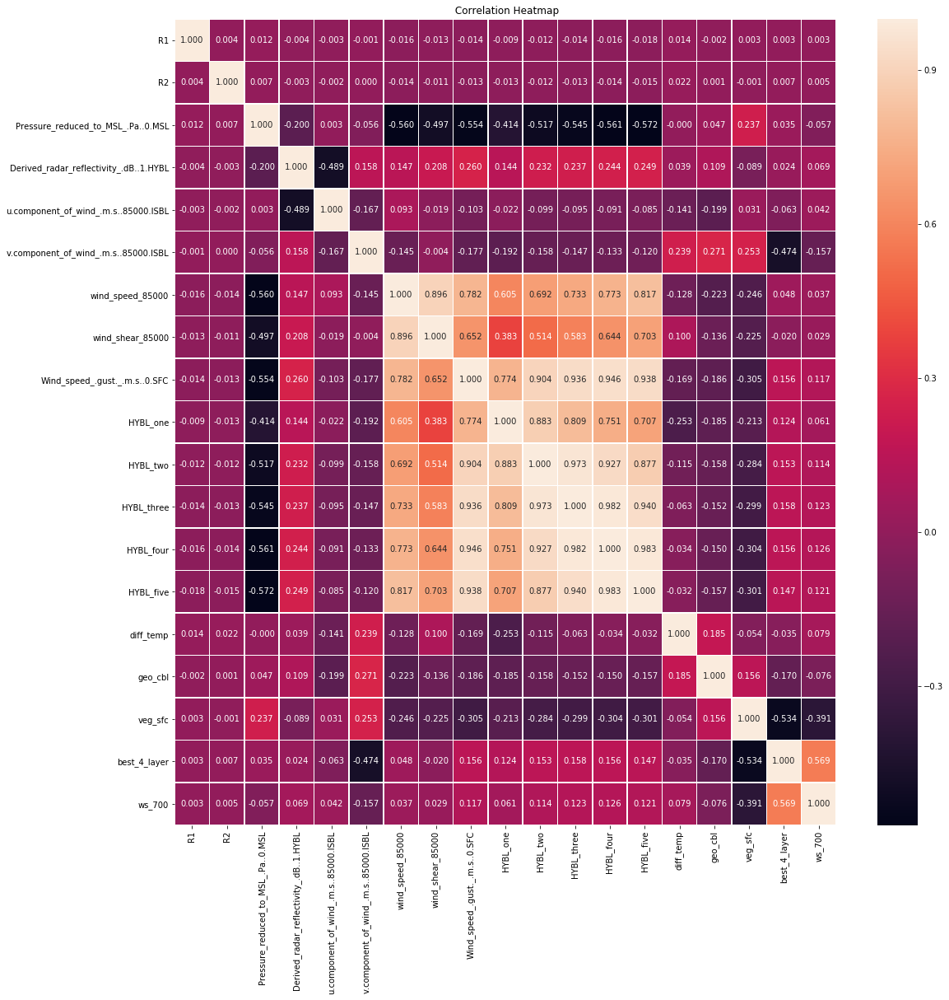

In [5]:
df_cor = df3.drop('max_th', axis = 1)
cor = df_cor.corr()
f,ax = plt.subplots(figsize = (18,18))
plt.title(' Correlation Heatmap')
sns.heatmap(cor, annot = True, linewidths = .5, fmt='.3f', ax = ax)

In [6]:
pd.options.display.max_columns = None
df3.groupby(['EXP','max_th']).agg(["mean", "std"])

R1                        R2                \
                       mean           std        mean           std   
EXP      max_th                                                       
1/4/18   0       192.996667   1739.706281  533.379972  19054.520405   
         1         4.917739      4.663138    7.941801     12.258688   
1/7/17   0        90.447744   1584.072886   69.246696    424.850977   
10/12/18 0        10.127913     60.951894    4.815725     64.662663   
         1        -0.773073      1.159675  -10.007513     35.196482   
10/2/18  0         4.184517     28.955131    5.898643     41.750508   
         1         0.228484      0.095711    0.318898      0.075480   
10/27/18 0        16.010719    210.196818   13.554166    210.668313   
         1         0.148446      0.070422    0.305860      0.184170   
10/29/17 0         1.299021      8.002656    3.323830     15.953752   
         1         0.341575      1.103360    5.108427     28.010547   
11/19/17 0         0.186556      0.394347    0.199401      0.294304   
         1        -0.031576      0.059267   -0.036719      0.133764   
12/17/18 0         0.811601      5.577193    1.098248      4.670811   
         1         0.211454      0.211036    0.549877      1.326305   
12/22/18 0         1.528681     10.517149    5.744268     53.588867   
         1         0.046412      0.611775    0.235625      2.250632   
12/9/17  0       145.537826   1426.157865  247.157199   4076.541758   
2/13/17  0         0.285917      1.618272    0.634240      4.568922   
         1         0.018342      0.153825    0.183920      2.089154   
2/24/19  0         3.382847     19.688200    3.723531     20.109076   
         1         0.103972      0.142689    0.152034      0.160452   
2/25/17  0         6.453845     22.526301   13.128533     45.824503   
         1         4.223824      8.213202   22.783887     36.895784   
2/9/17   0        21.254596     89.583895   84.482352   1921.864820   
         1         1.935435      2.187414    2.855045      4.503544   
3/14/17  0        33.896677    195.439338   34.703272    248.900853   
         1         0.087577      0.072350    0.212800      0.160911   
3/2/17   0         0.508528      7.549044    0.222545      3.242914   
         1        -0.106775      0.196010   -0.165423      0.320458   
3/2/18   0         0.789647      2.199430    1.549476      5.243059   
         1         2.475051      6.113945    5.187169     18.030573   
3/21/18  0         6.035312     16.421513    7.253549     21.594145   
3/22/17  0        -0.390491      9.233017   -2.254766     22.363660   
         1        -0.773893      1.684317   -9.460969     30.155046   
3/7/18   0         5.341121     47.979010   14.515619     53.799028   
         1         0.157995      0.037539    0.326987      0.023598   
5/15/18  0        23.620051    445.728588   17.997325    218.758471   
         1         0.366555      0.853892   -5.918120     50.404345   
5/26/18  0        25.623212    411.646929   11.837542   1757.322098   
6/13/18  0         0.781185      5.833840    2.215424     37.706391   
         1         0.276500           NaN    0.883972           NaN   
6/19/17  0         3.627619     41.624588    6.487894     86.314220   
         1         0.686832      0.888131    2.723891      2.597520   
7/13/17  0        37.595850    851.150385   21.248084    432.272037   
         1        -1.208043      2.012561   -0.031020      0.410743   
7/17/18  0        37.413146    213.556024   91.058465   1387.103630   
         1        20.597329     27.116617   82.273897    223.830616   
7/21/18  0        -9.656203    185.613575  -12.633378     96.641624   
         1         0.684109      1.024933    5.248201     12.409534   
8/17/18  0        -9.005560    101.463650    4.041791    321.660354   
         1         1.472294      1.325268   10.669465     17.114291   
9/10/18  0         7.579876     31.969814    9.927208     33.960566   
         1         0.103972      0.089972    0.35

In [7]:
df3.groupby(['EXP','max_th']).size()

EXP       max_th
1/4/18    0         2234
          1          243
1/7/17    0         1959
10/12/18  0         2218
          1           45
10/2/18   0         2072
          1            3
10/27/18  0         2002
          1          108
10/29/17  0         2260
          1          111
11/19/17  0         2142
          1          323
12/17/18  0         1906
          1          179
12/22/18  0         2073
          1          175
12/9/17   0         2531
2/13/17   0         1416
          1          541
2/24/19   0         2062
          1          274
2/25/17   0         1977
          1           31
2/9/17    0         2008
          1           53
3/14/17   0         1952
          1          181
3/2/17    0         1536
          1          629
3/2/18    0         2253
          1          177
3/21/18   0         2332
3/22/17   0         1743
          1          421
3/7/18    0         2522
          1            4
5/15/18   0         2457
          1           46
5/26/18 

### Scatter Plots of Predictors 

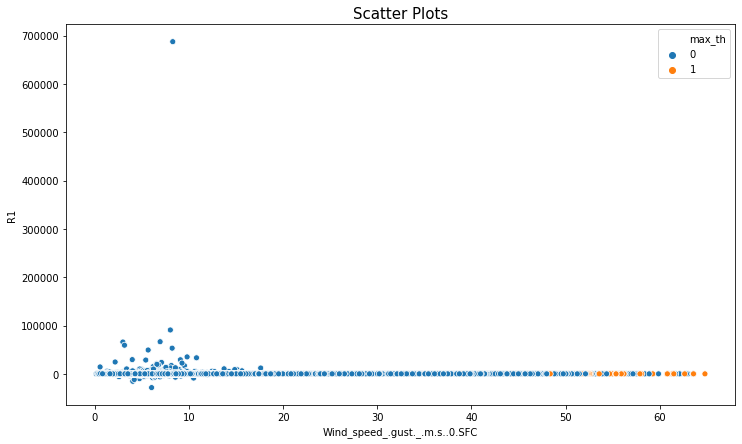

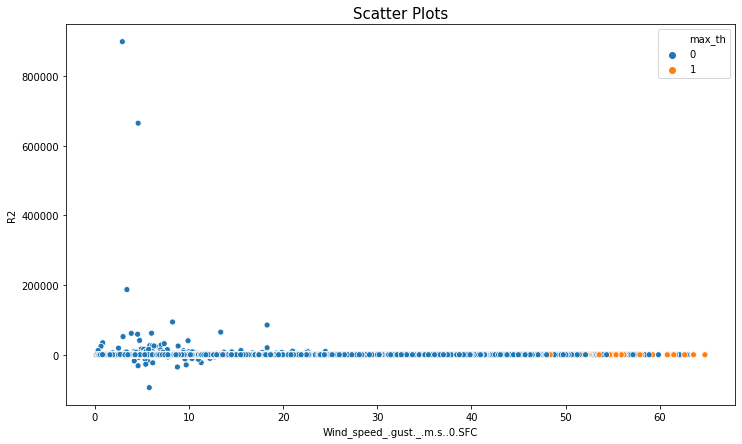

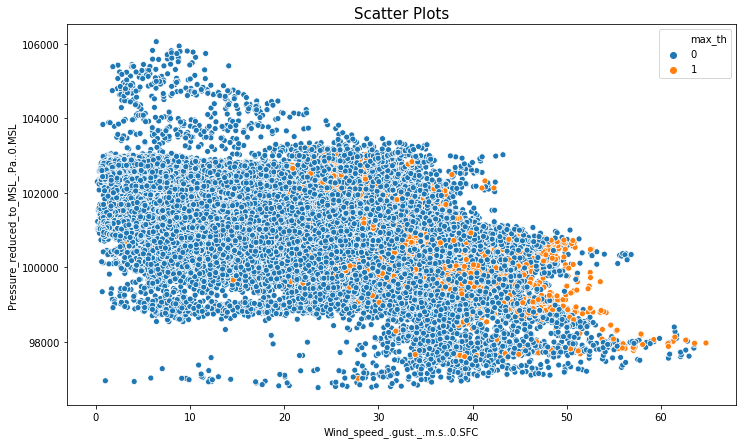

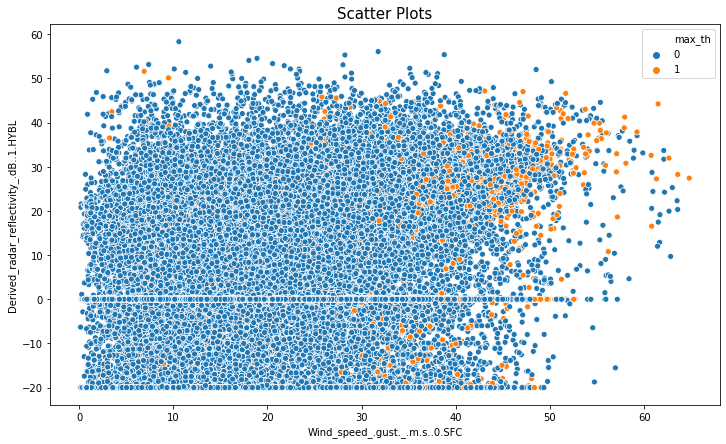

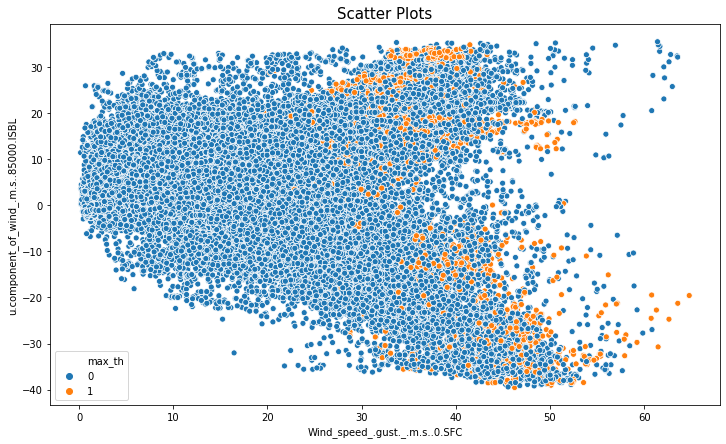

...

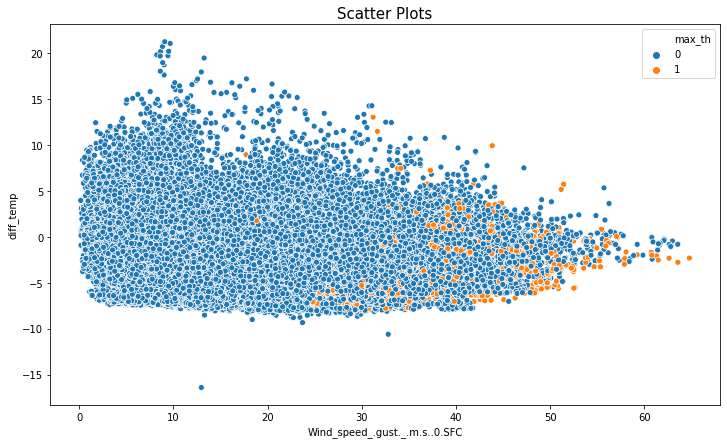

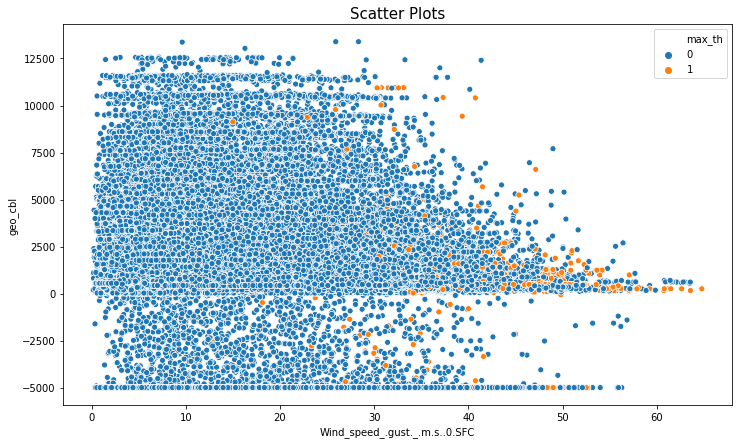

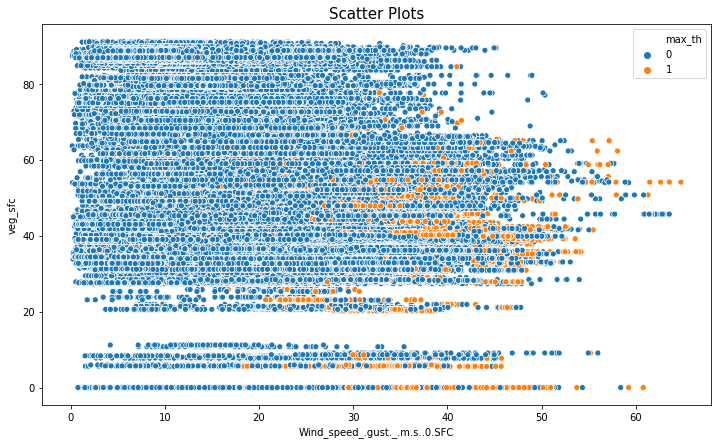

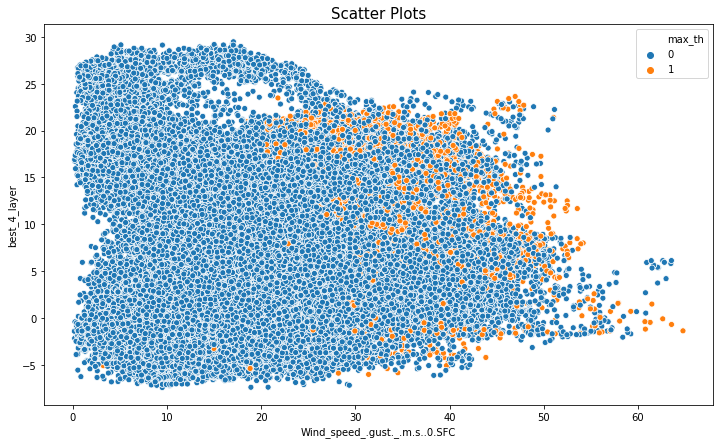

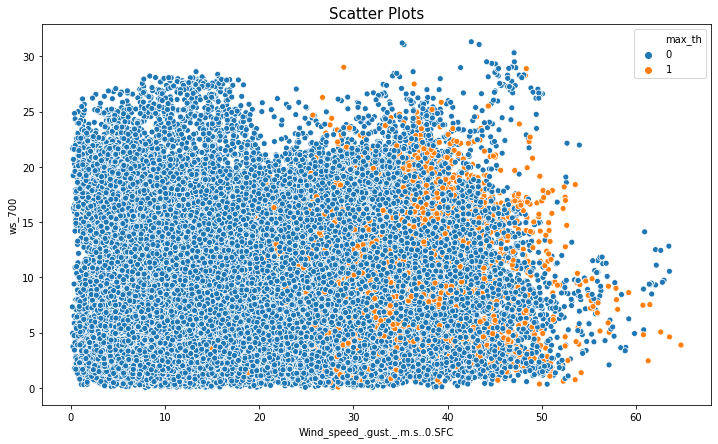

In [9]:
col = ['R1','R2','Pressure_reduced_to_MSL_.Pa..0.MSL',
       'Derived_radar_reflectivity_.dB..1.HYBL',
       'u.component_of_wind_.m.s..85000.ISBL',
       'v.component_of_wind_.m.s..85000.ISBL', 'wind_speed_85000',
       'wind_shear_85000', 'HYBL_one',
       'HYBL_two', 'HYBL_three', 'HYBL_four', 'HYBL_five', 'diff_temp',
       'geo_cbl', 'veg_sfc', 'best_4_layer', 'ws_700']

for i in col:
    plt.figure(figsize = (12,7))
    sns.scatterplot(x = 'Wind_speed_.gust._.m.s..0.SFC', y = i, data = df, hue = 'max_th')
    plt.title('Scatter Plots', size = 15)
    plt.show()

### Scatter plots of R1 vs R2

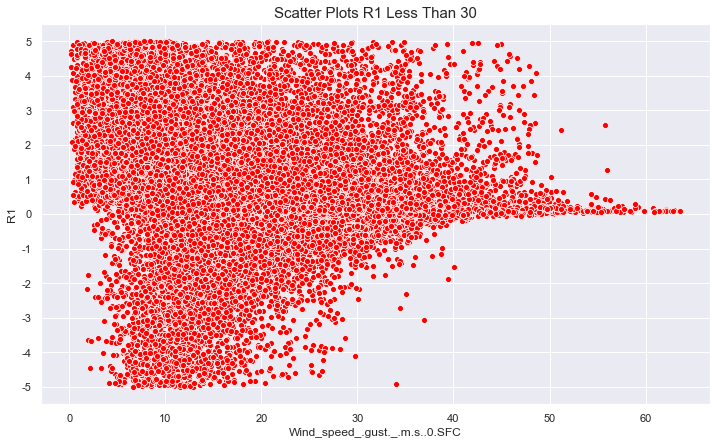

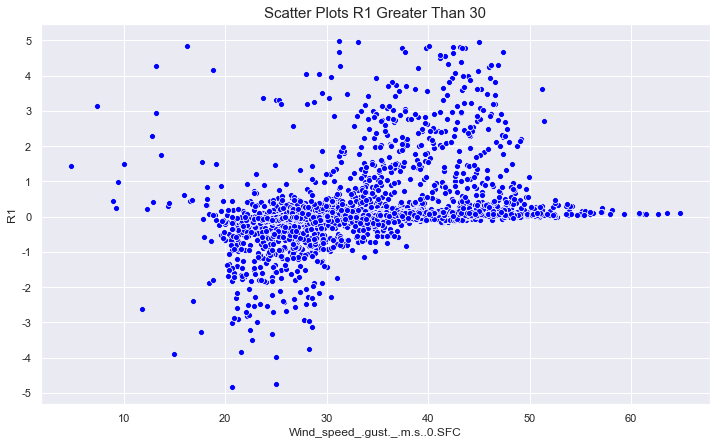

In [30]:
df45 = df[(df['R1'] < 5) & (df['R1'] > -5)]
df_0 = df45[df45['max_th'] ==  0]
df_1 = df45[df45['max_th'] ==  1]
sns.set()
plt.figure(figsize = (12,7))
sns.scatterplot(x = 'Wind_speed_.gust._.m.s..0.SFC', y = 'R1', data = df_0,color = 'red')
plt.title('Scatter Plots R1 Less Than 30', size = 15)
plt.yticks(range(-5,6),[-5,-4,-3,-2,-1,0,1,2,3,4,5])
plt.show()
plt.figure(figsize = (12,7))
sns.scatterplot(x = 'Wind_speed_.gust._.m.s..0.SFC', y = 'R1', data = df_1,color = 'blue')
plt.title('Scatter Plots R1 Greater Than 30', size = 15)
plt.yticks(range(-5,6),[-5,-4,-3,-2,-1,0,1,2,3,4,5])
plt.show()



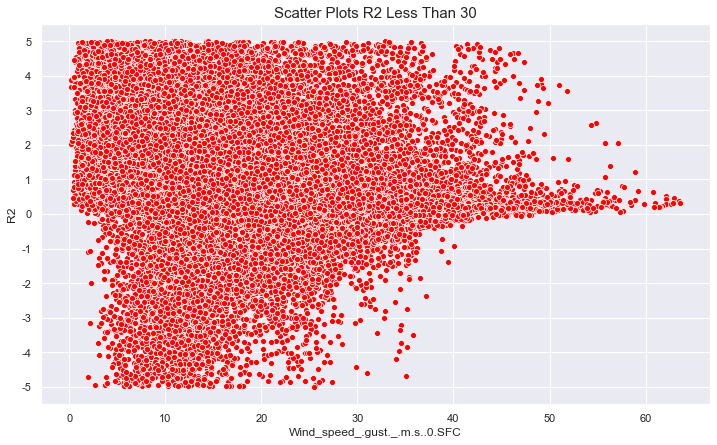

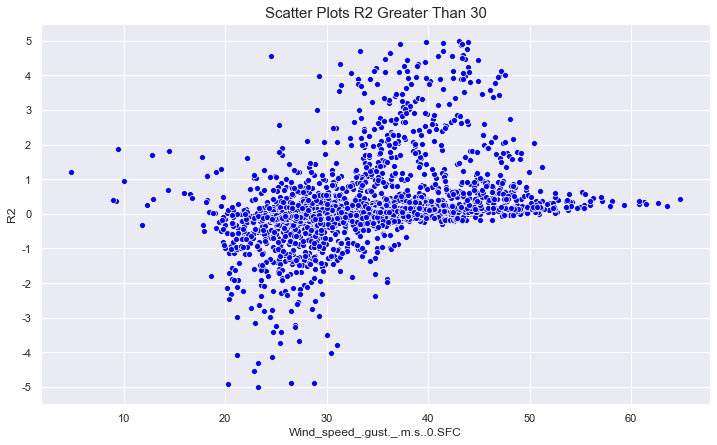

In [31]:
df46 = df[(df['R2'] < 5) & (df['R2'] > -5)]
df_0 = df46[df46['max_th'] ==  0]
df_1 = df46[df46['max_th'] ==  1]
sns.set()
plt.figure(figsize = (12,7))
sns.scatterplot(x = 'Wind_speed_.gust._.m.s..0.SFC', y = 'R2', data = df_0,color = 'red')
plt.title('Scatter Plots R2 Less Than 30', size = 15)
plt.yticks(range(-5,6),[-5,-4,-3,-2,-1,0,1,2,3,4,5])
plt.show()
plt.figure(figsize = (12,7))
sns.scatterplot(x = 'Wind_speed_.gust._.m.s..0.SFC', y = 'R2', data = df_1,color = 'blue')
plt.title('Scatter Plots R2 Greater Than 30', size = 15)
plt.yticks(range(-5,6),[-5,-4,-3,-2,-1,0,1,2,3,4,5])
plt.show()

<Figure size 1152x576 with 0 Axes>

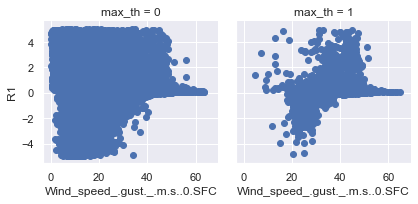

In [18]:
plt.figure(figsize = (16,8))
g = sns.FacetGrid(df45, col="max_th")
g.map(plt.scatter, "Wind_speed_.gust._.m.s..0.SFC", 'R1')

### Label encoder 

In [10]:
df2 = df[['Type', 'from', 'EXP',
       'max_wind_speed', 'R1', 'R2',
       'Pressure_reduced_to_MSL_.Pa..0.MSL',
       'Derived_radar_reflectivity_.dB..1.HYBL',
       'u.component_of_wind_.m.s..85000.ISBL',
       'v.component_of_wind_.m.s..85000.ISBL', 'wind_speed_85000',
       'wind_shear_85000', 'Wind_speed_.gust._.m.s..0.SFC', 'HYBL_one',
       'HYBL_two', 'HYBL_three', 'HYBL_four', 'HYBL_five', 'diff_temp',
       'geo_cbl', 'veg_sfc', 'best_4_layer', 'ws_700', 'max_th']]

le = LabelEncoder()
df2['from'] = le.fit_transform(df2['from'])
df2.tail(2)

,Type,from,EXP,max_wind_speed,R1,R2,Pressure_reduced_to_MSL_.Pa..0.MSL,Derived_radar_reflectivity_.dB..1.HYBL,u.component_of_wind_.m.s..85000.ISBL,v.component_of_wind_.m.s..85000.ISBL,wind_speed_85000,wind_shear_85000,Wind_speed_.gust._.m.s..0.SFC,HYBL_one,HYBL_two,HYBL_three,HYBL_four,HYBL_five,diff_temp,geo_cbl,veg_sfc,best_4_layer,ws_700,max_th
72647,WBOU,1,7/21/18,17.105792,0.279731,0.693772,101143.383,34.181,-23.227,16.669,28.589318,23.717743,36.674,9.634310,16.364893,18.456569,21.401767,24.263238,3.607,554.661,81.379,0.706,8.964475,0
72648,WBOU,1,7/21/18,17.105792,0.231301,0.605321,101104.297,36.779,-26.560,16.630,31.336728,25.879360,37.023,8.939975,16.514877,18.701148,22.068564,24.935163,3.349,555.042,81.379,0.171,7.752404,0


### Feature Importance 

In [11]:
from sklearn.ensemble import RandomForestClassifier

In [12]:
X = df2.drop(['Type','EXP', 'max_wind_speed', 'max_th'], axis = 1)
y = df2['max_th']

In [13]:
model = RandomForestClassifier()
model.fit(X, y)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

### Scatter plots of important features all data

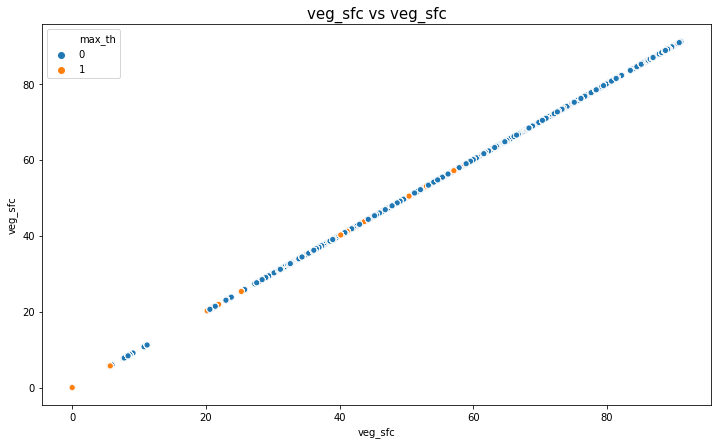

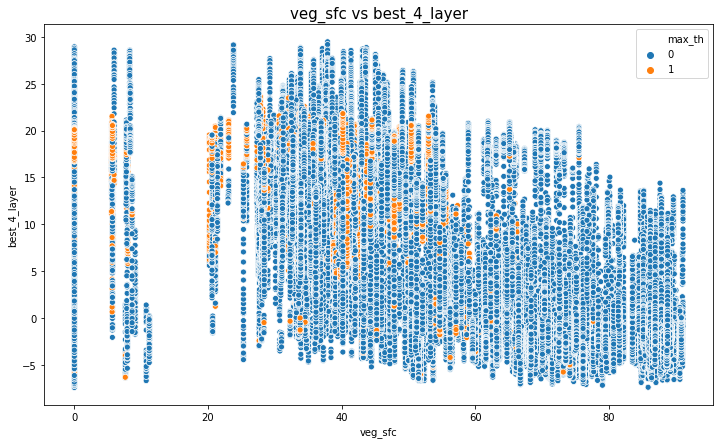

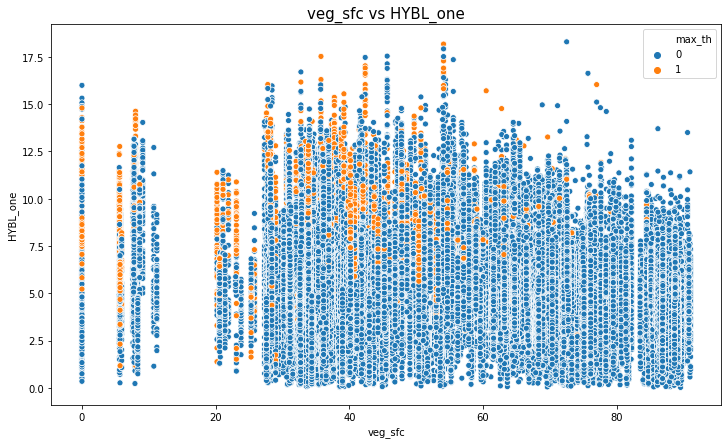

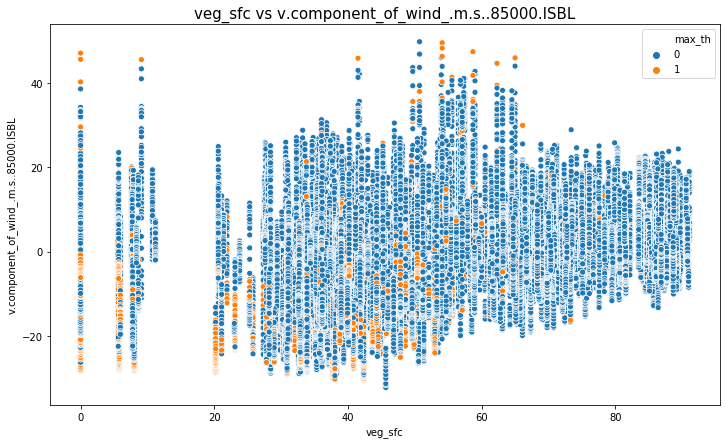

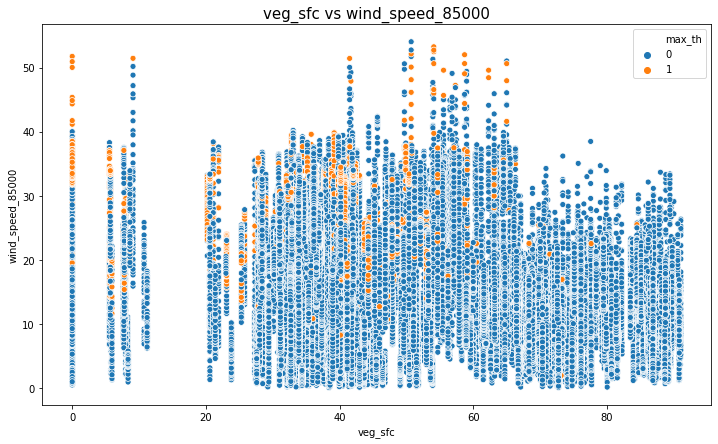

...

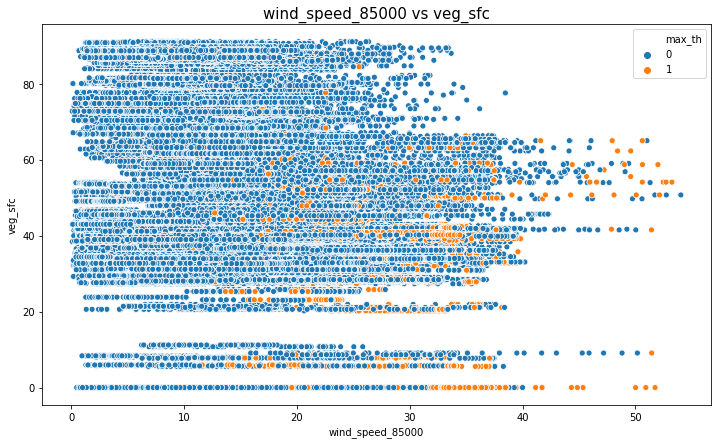

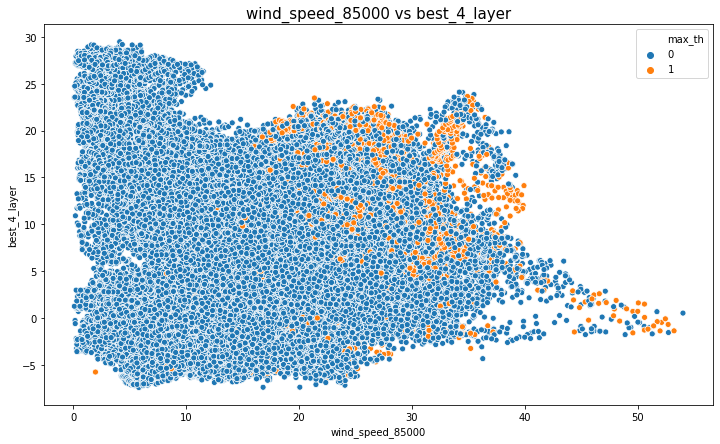

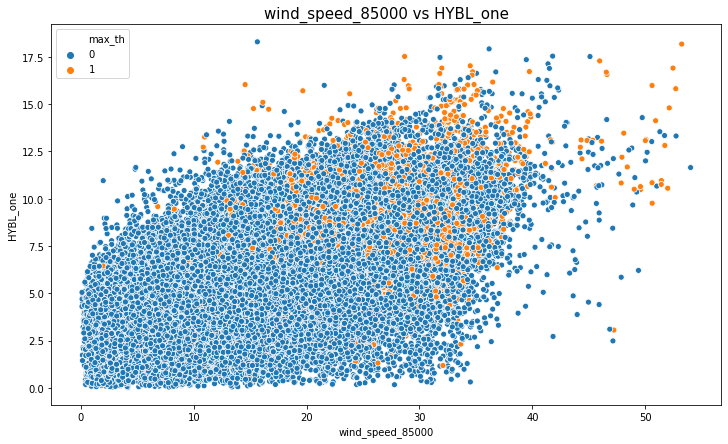

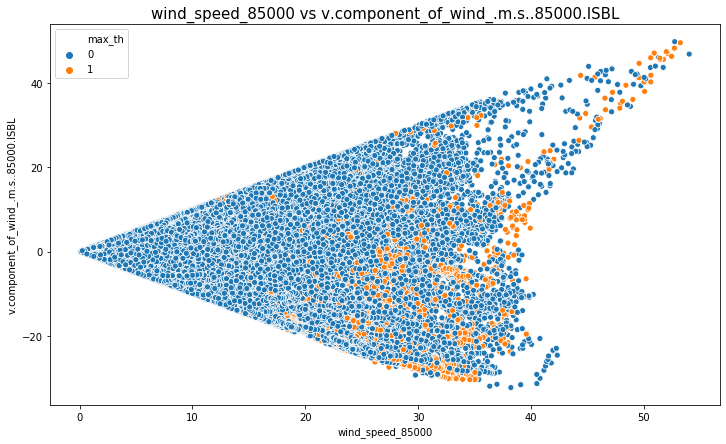

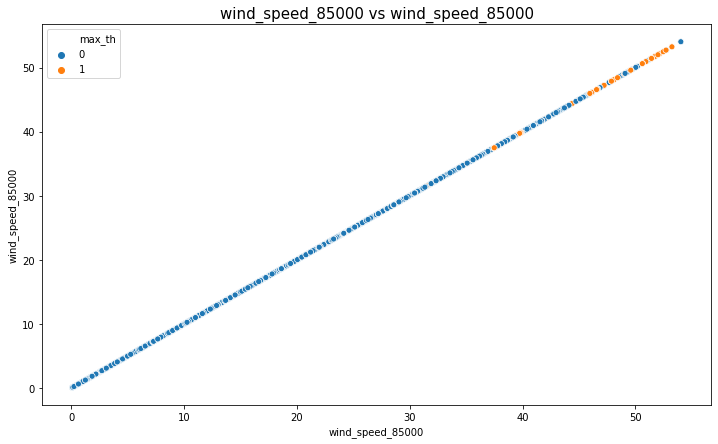

In [15]:
feature_importances = pd.DataFrame(model.feature_importances_,
                                   index = X.columns,
                                   columns=['importance']).sort_values('importance', ascending = False)
col2 = list(feature_importances.index[:5])
for i in col2:
    for xx in col2:
        plt.figure(figsize = (12,7))
        sns.scatterplot(x = i, y = xx, data = df3, hue = 'max_th')
        plt.title(i + ' vs ' + xx, size = 15)
        plt.show()

In [19]:
col2

['veg_sfc',
 'best_4_layer',
 'HYBL_one',
 'v.component_of_wind_.m.s..85000.ISBL',
 'wind_speed_85000']

### Model for top 5 features based on date

In [20]:
def model_info(x, y, test_date, data_tested,col):
    cm = confusion_matrix(x,y)
    acc = accuracy_score(x,y)
    rec = recall_score(x,y)
    rec_0 = recall_score(x,y, pos_label=0)
    data = [{"Accuracy":acc,"Specificity":rec_0, "Sensitivity":rec}]
    df = pd.DataFrame(data)
    df['test_date'] = test_date
    df['data_tested'] = data_tested
    if len(x.value_counts()) == 1:
        l30 = x.value_counts()[0]
        df['greter_than_30'] = '0'
        df['less_than_30'] = l30
    else:
        g30 = x.value_counts()[1]
        l30 = x.value_counts()[0]
        df['greter_than_30'] = g30
        df['less_than_30'] = l30
    df['num_1'] = col[0]
    df['num_2'] = col[1]
    df['num_3'] = col[2]
    df['num_4'] = col[3]
    df['num_5'] = col[4]
    return (df)

In [21]:
def rf_model(x):
    test_1 = df2[df2.EXP == x]
    train_1 = df2[df2.EXP != x]
    train_1 = train_1[['Type', 'from', 'R1', 'R2',
       'Pressure_reduced_to_MSL_.Pa..0.MSL',
       'Derived_radar_reflectivity_.dB..1.HYBL',
       'u.component_of_wind_.m.s..85000.ISBL',
       'v.component_of_wind_.m.s..85000.ISBL', 'wind_speed_85000',
       'wind_shear_85000', 'Wind_speed_.gust._.m.s..0.SFC', 'HYBL_one',
       'HYBL_two', 'HYBL_three', 'HYBL_four', 'HYBL_five', 'diff_temp',
       'geo_cbl', 'veg_sfc', 'best_4_layer', 'ws_700','max_th','max_wind_speed']]


    test_1 = test_1[['Type', 'from', 'R1', 'R2',
       'Pressure_reduced_to_MSL_.Pa..0.MSL',
       'Derived_radar_reflectivity_.dB..1.HYBL',
       'u.component_of_wind_.m.s..85000.ISBL',
       'v.component_of_wind_.m.s..85000.ISBL', 'wind_speed_85000',
       'wind_shear_85000', 'Wind_speed_.gust._.m.s..0.SFC', 'HYBL_one',
       'HYBL_two', 'HYBL_three', 'HYBL_four', 'HYBL_five', 'diff_temp',
       'geo_cbl', 'veg_sfc', 'best_4_layer', 'ws_700','max_th','max_wind_speed']]
    x_train = train_1.drop('max_th', 1)
    x_train.drop(['Type','max_wind_speed'], axis=1, inplace=True)
    y_train = train_1.max_th
    x_test = test_1.drop('max_th', 1)
    x_test_copy = x_test.copy()
    x_test.drop(['Type','max_wind_speed'], axis=1, inplace=True)
    y_test = test_1.max_th
    
    model = RandomForestClassifier(n_estimators=250, bootstrap= False, max_depth = 3, max_features= 'sqrt', min_samples_split = 3,
                               random_state=19)
    model.fit(x_train, y_train)
    
    feature_importances = pd.DataFrame(model.feature_importances_,
                                   index = X.columns,
                                   columns=['importance']).sort_values('importance', ascending = False)
    col2 = list(feature_importances.index[:5])
    
    x_train = x_train[col2]
    x_test = x_test[col2]
    print('top 5 feature importance:', col2)
    model.fit(x_train, y_train)
    
    
    pred_train = model.predict(x_train)
    train_info = model_info(y_train, pred_train, x , "train", col2)

    pred_test = model.predict(x_test)
    test_info = model_info(y_test, pred_test, x , "test", col2)

    table = train_info.append(test_info)
    
    print(x)
    print(table.iloc[:, 0:6])
    print("--" * 40)
    return(table)

In [22]:
table = pd.DataFrame()
for i in df['EXP'].unique():
    t = rf_model(i)
    table = table.append(t)

top 5 feature importance: ['HYBL_one', 'veg_sfc', 'HYBL_two', 'wind_speed_85000', 'Wind_speed_.gust._.m.s..0.SFC']
1/7/17
   Accuracy  Specificity  Sensitivity test_date data_tested greter_than_30
0  0.952469     0.998196     0.107713    1/7/17       train           3630
0  1.000000     1.000000     0.000000    1/7/17        test              0
--------------------------------------------------------------------------------
top 5 feature importance: ['HYBL_one', 'veg_sfc', 'HYBL_two', 'wind_speed_85000', 'HYBL_three']
2/9/17
   Accuracy  Specificity  Sensitivity test_date data_tested  greter_than_30
0  0.952414     0.998732     0.084708    2/9/17       train            3577
0  0.976225     0.998008     0.150943    2/9/17        test              53
--------------------------------------------------------------------------------
top 5 feature importance: ['HYBL_one', 'veg_sfc', 'HYBL_two', 'best_4_layer', 'wind_speed_85000']
2/13/17
   Accuracy  Specificity  Sensitivity test_date data_t

top 5 feature importance: ['HYBL_one', 'veg_sfc', 'HYBL_two', 'wind_speed_85000', 'HYBL_three']
7/21/18
   Accuracy  Specificity  Sensitivity test_date data_tested  greter_than_30
0  0.952136     0.998334     0.102182   7/21/18       train            3621
0  0.995434     0.998750     0.111111   7/21/18        test               9
--------------------------------------------------------------------------------
top 5 feature importance: ['HYBL_one', 'veg_sfc', 'HYBL_two', 'wind_speed_85000', 'HYBL_three']
8/17/18
   Accuracy  Specificity  Sensitivity test_date data_tested  greter_than_30
0  0.952678      0.99822     0.112338   8/17/18       train            3623
0  0.996780      1.00000     0.000000   8/17/18        test               7
--------------------------------------------------------------------------------
top 5 feature importance: ['HYBL_one', 'veg_sfc', 'HYBL_two', 'wind_speed_85000', 'HYBL_three']
9/4/18
   Accuracy  Specificity  Sensitivity test_date data_tested greter_than

In [24]:
#table.to_csv('Top5_features_results.csv')

### Features by rank

In [39]:
df_test = table[table['data_tested'] == 'test']
df_test2 = df_test[['num_1', 'num_2', 'num_3', 'num_4', 'num_5']]
df10 = pd.melt(df_test2, var_name='rank', value_name = 'name')
df11 = df10.groupby(['rank', 'name']).size().reset_index(name="count")
df11['pct'] = round((df11['count'] / 32) * 100,2)
df11

,rank,name,count,pct
0,num_1,HYBL_one,31,96.88
1,num_1,HYBL_two,1,3.12
2,num_2,HYBL_two,5,15.62
3,num_2,veg_sfc,27,84.38
4,num_3,HYBL_one,1,3.12
5,num_3,HYBL_two,24,75.00
6,num_3,veg_sfc,5,15.62
7,num_3,wind_speed_85000,2,6.25
8,num_4,HYBL_two,2,6.25
9,num_4,best_4_layer,1,3.12


In [46]:
df11.loc[df11.groupby('rank')['pct'].idxmax()]

,rank,name,count,pct
0,num_1,HYBL_one,31,96.88
3,num_2,veg_sfc,27,84.38
5,num_3,HYBL_two,24,75.00
11,num_4,wind_speed_85000,28,87.50
12,num_5,HYBL_three,22,68.75
